In [24]:
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler 
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from scipy.stats import randint, uniform
import xgboost as xgb
data_test = data
data = data[(data.index.month >= 1) & (data.index.month <= 11)]
X = data[features_columns]
y = data[target_column]


tss = TimeSeriesSplit(n_splits=4)

param_distributions = {
    'xgbregressor__n_estimators': randint(100, 1000),
    'xgbregressor__learning_rate': uniform(0.01, 0.3),
    'xgbregressor__max_depth': randint(3, 15),
    'xgbregressor__gamma': uniform(0.1, 1),
    'xgbregressor__subsample': uniform(0.6, 0.4),
    'xgbregressor__colsample_bytree': uniform(0.7, 0.3)
}

model = xgb.XGBRegressor(objective='reg:squarederror', random_state=42)
pipeline = Pipeline([
    ('scaler', StandardScaler()), 
    ('xgbregressor', model)  
])

random_search_xgboost = RandomizedSearchCV(
    estimator=pipeline,
    param_distributions=param_distributions,
    n_iter=20,
    scoring='neg_mean_squared_error',
    cv=tss,
    random_state=2,
    verbose=2,
    return_train_score=True
)

random_search_xgboost.fit(X, y)
best_params = random_search_xgboost.best_params_


Fitting 4 folds for each of 20 candidates, totalling 80 fits
[CV] END xgbregressor__colsample_bytree=0.830798470642601, xgbregressor__gamma=0.12592623182789134, xgbregressor__learning_rate=0.17489874336361275, xgbregressor__max_depth=5, xgbregressor__n_estimators=175, xgbregressor__subsample=0.7681471208349956; total time=   0.2s
[CV] END xgbregressor__colsample_bytree=0.830798470642601, xgbregressor__gamma=0.12592623182789134, xgbregressor__learning_rate=0.17489874336361275, xgbregressor__max_depth=5, xgbregressor__n_estimators=175, xgbregressor__subsample=0.7681471208349956; total time=   0.3s
[CV] END xgbregressor__colsample_bytree=0.830798470642601, xgbregressor__gamma=0.12592623182789134, xgbregressor__learning_rate=0.17489874336361275, xgbregressor__max_depth=5, xgbregressor__n_estimators=175, xgbregressor__subsample=0.7681471208349956; total time=   0.4s
[CV] END xgbregressor__colsample_bytree=0.830798470642601, xgbregressor__gamma=0.12592623182789134, xgbregressor__learning_rat

In [25]:
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
from sklearn.preprocessing import StandardScaler
import numpy as np
import xgboost as xgb

best_params = random_search_xgboost.best_params_
best_xgboost_model = random_search_xgboost.best_estimator_

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.model_selection import TimeSeriesSplit
import numpy as np
import pandas as pd
import xgboost as xgb

n_splits = 4
tss = TimeSeriesSplit(n_splits=n_splits)
results = {
    'train_rmse': [],
    'test_rmse': [],
    'train_mae': [],
    'test_mae': []
}

# Standardize X and y
X = pd.DataFrame(X) if not isinstance(X, pd.DataFrame) else X
y = pd.Series(y) if not isinstance(y, pd.Series) else y

# Iterate through TimeSeries splits
for fold, (train_idx, test_idx) in enumerate(tss.split(X)):
    # Split data into training and testing sets
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    # Predict and calculate metrics
    y_train_pred = best_xgboost_model.predict(X_train)
    y_test_pred = best_xgboost_model.predict(X_test)
    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    # Append results for each fold
    results['train_rmse'].append(train_rmse)
    results['test_rmse'].append(test_rmse)
    results['train_mae'].append(train_mae)
    results['test_mae'].append(test_mae)

    # Print results per fold
    print(f"Fold {fold+1}: Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}, Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")


overall_results = {
    'train_rmse': np.mean(results['train_rmse']),
    'test_rmse': np.mean(results['test_rmse']),
    'train_mae': np.mean(results['train_mae']),
    'test_mae': np.mean(results['test_mae'])
}
print("Overall CV Results:", overall_results)

Fold 1: Train RMSE: 14.7732, Test RMSE: 12.6315, Train MAE: 11.0724, Test MAE: 8.7987
Fold 2: Train RMSE: 13.7442, Test RMSE: 12.6924, Train MAE: 9.9356, Test MAE: 9.0429
Fold 3: Train RMSE: 13.4027, Test RMSE: 12.3976, Train MAE: 9.6380, Test MAE: 8.8408
Fold 4: Train RMSE: 13.1587, Test RMSE: 12.4520, Train MAE: 9.4387, Test MAE: 8.8947
Overall CV Results: {'train_rmse': 13.769700429121889, 'test_rmse': 12.543352363157982, 'train_mae': 10.021181466800597, 'test_mae': 8.89425455838463}


## For forecast - For 1 day

In [49]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]

y_test_day_pred = random_search_xgboost.best_estimator_.predict(X_test_day)

test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))

test_mae = mean_absolute_error(y_test_day, y_test_day_pred)

test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")

Test RMSE: 14.04279531230887
Test MAE: 10.322859723705063
Test MAPE: 37.846697756065936


C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\4029678181.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = data_test_day.index.hour


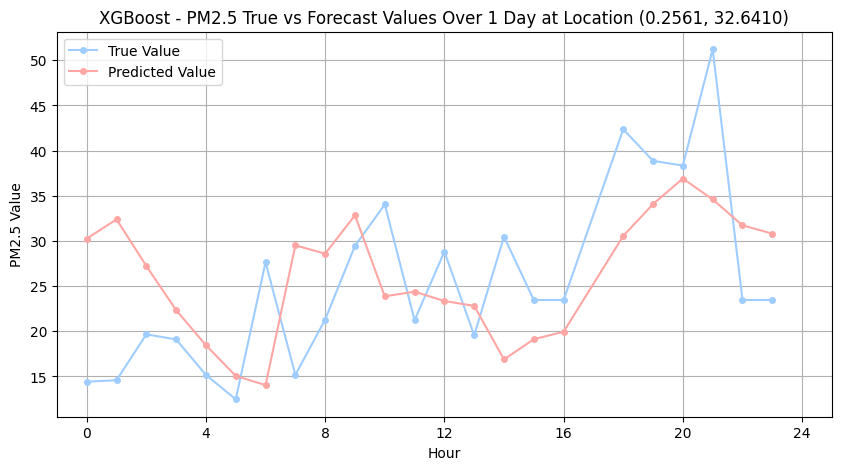

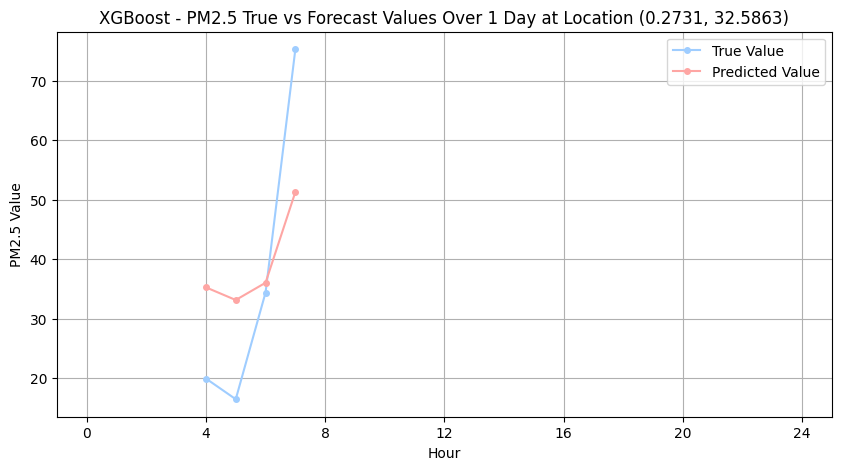

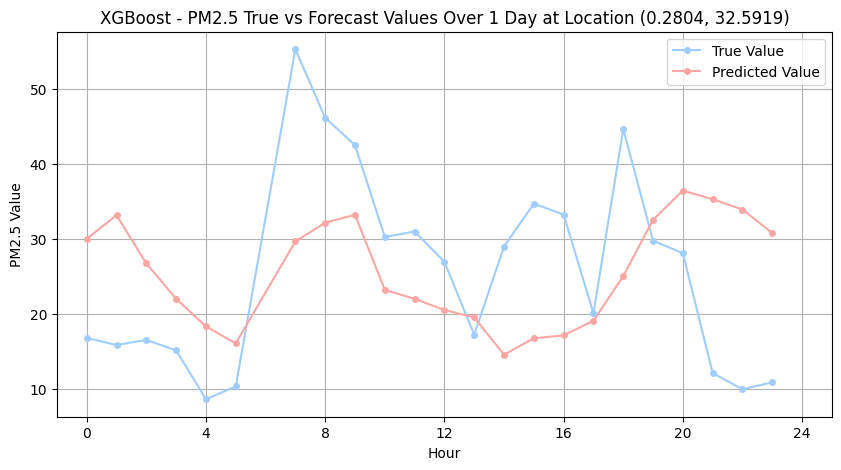

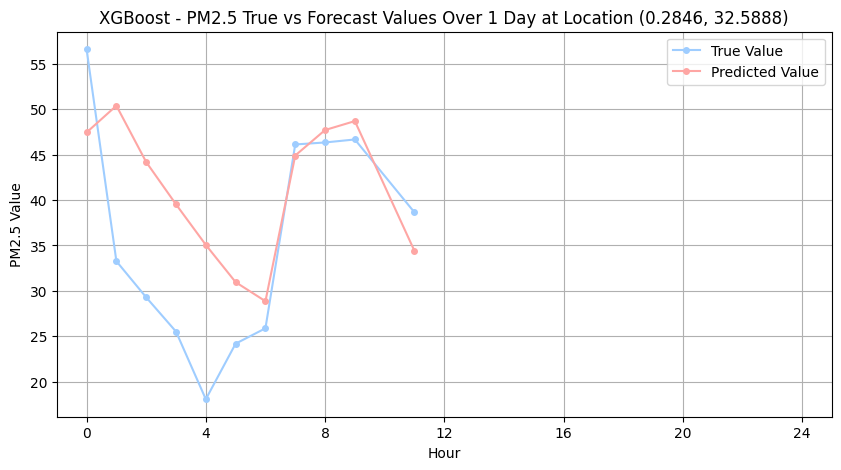

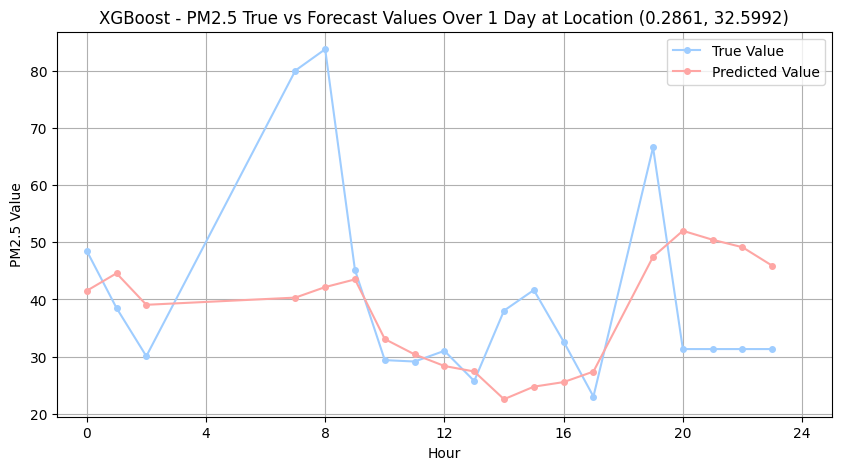

...

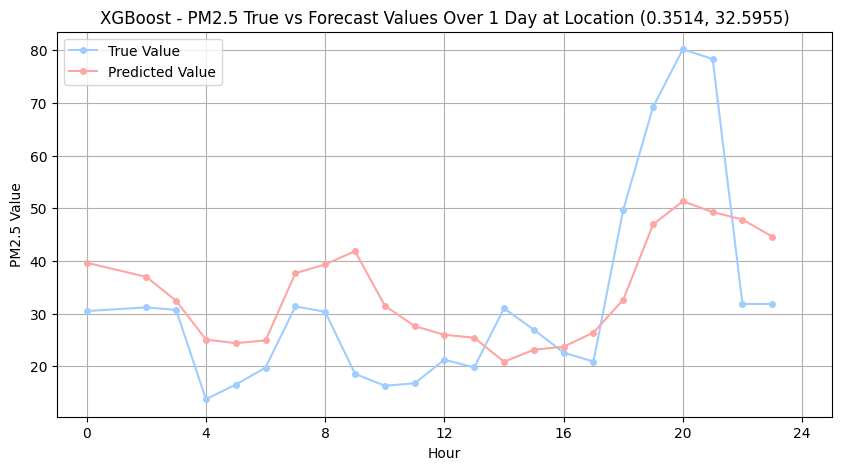

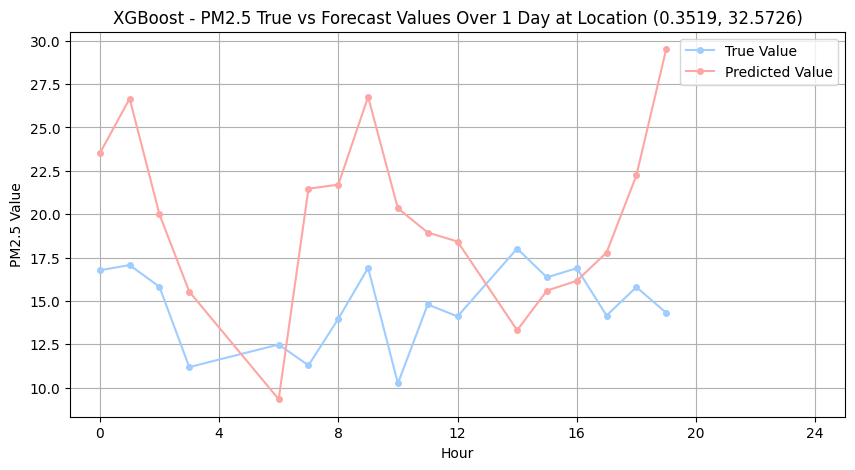

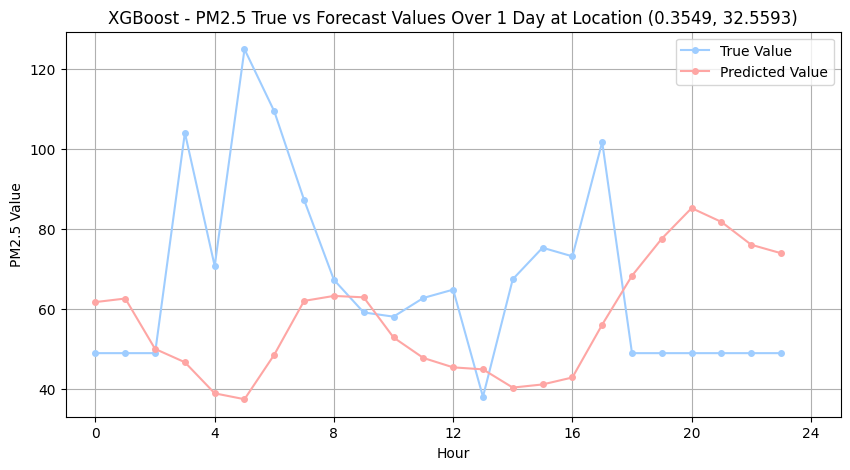

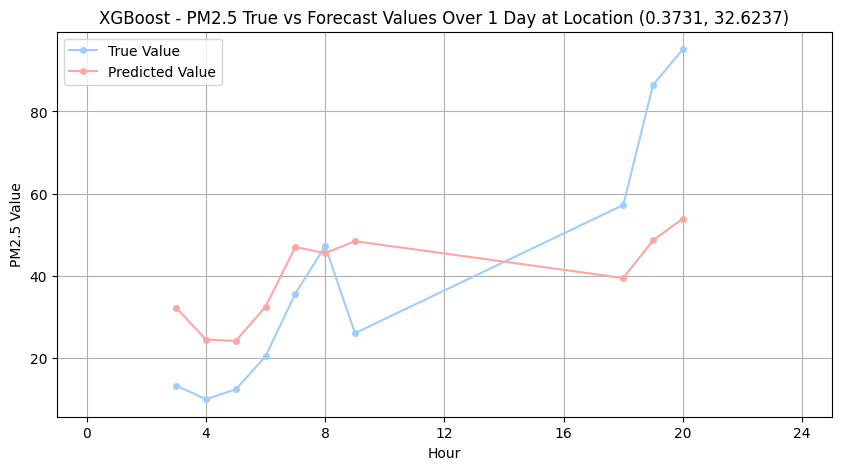

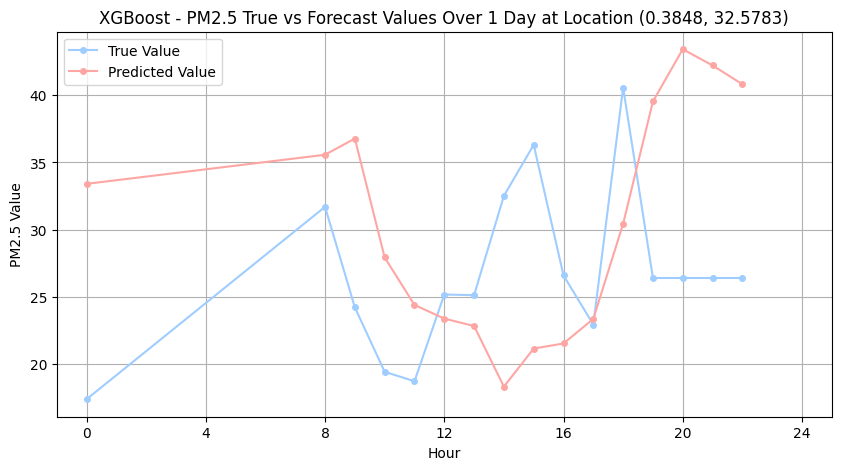

In [52]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

data_test_day['hour'] = data_test_day.index.hour
results = pd.DataFrame()
grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])

for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_xgboost.best_estimator_.predict(X)

    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')  # 蓝色，小点
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')  # 红色，小点
    plt.title(f"XGBoost - PM2.5 True vs Forecast Values Over 1 Day at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks([0, 4, 8, 12, 16, 20, 24])
    plt.xlim(-1, 25)
    plt.legend()
    plt.grid(True)
    plt.show()




## For forecast - For 7 days

In [54]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=7)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]


y_test_day_pred = random_search_xgboost.best_estimator_.predict(X_test_day)
test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))
test_mae = mean_absolute_error(y_test_day, y_test_day_pred)
test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")


Test RMSE: 12.872061981892077
Test MAE: 9.06770657112396
Test MAPE: 36.91796967210967


C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\806903869.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day
C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\806903869.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour


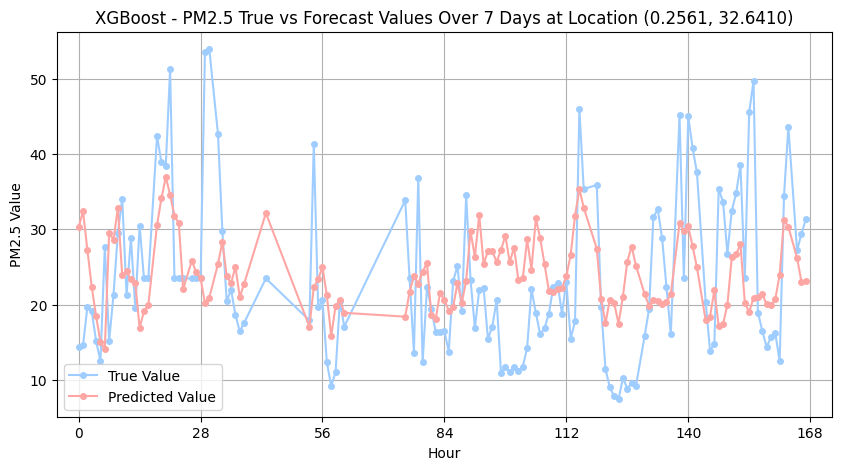

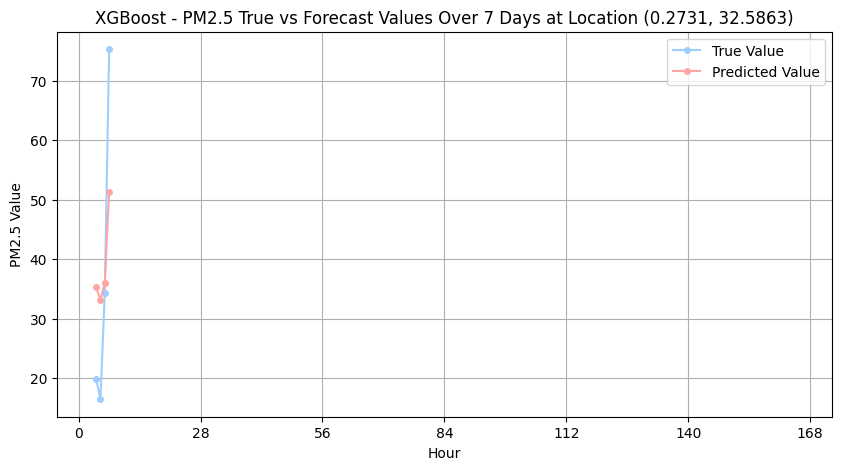

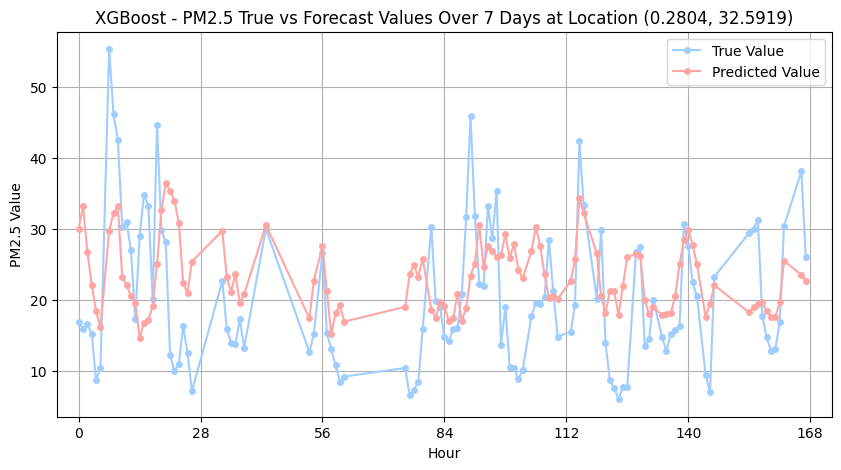

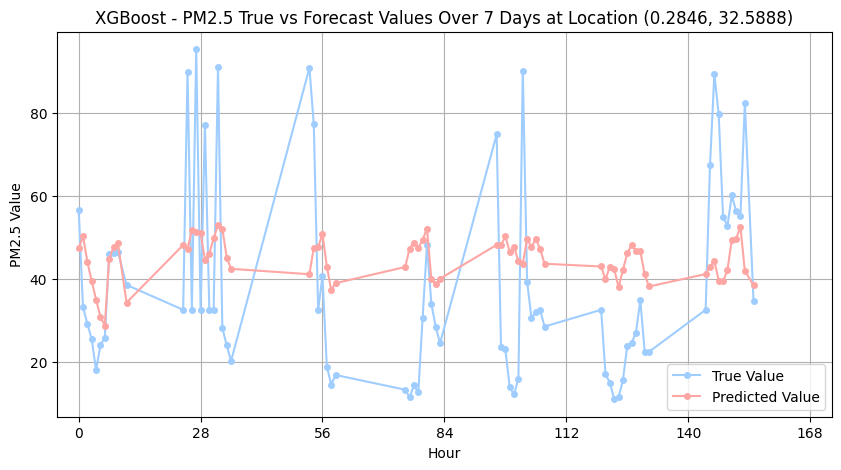

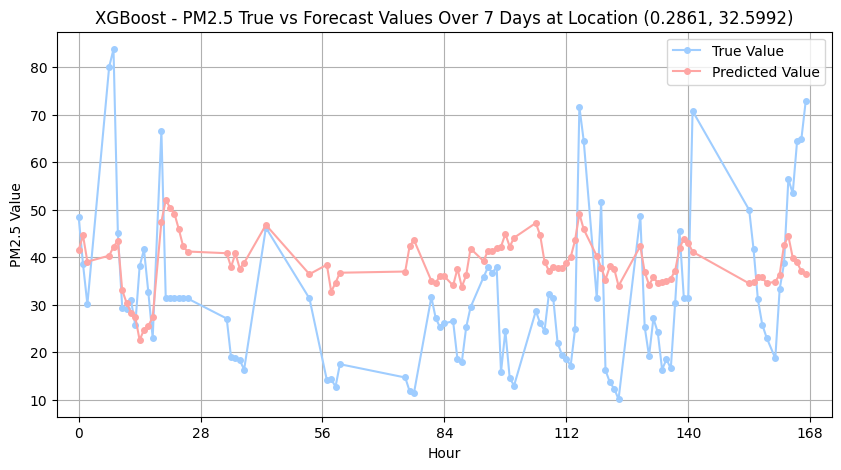

...

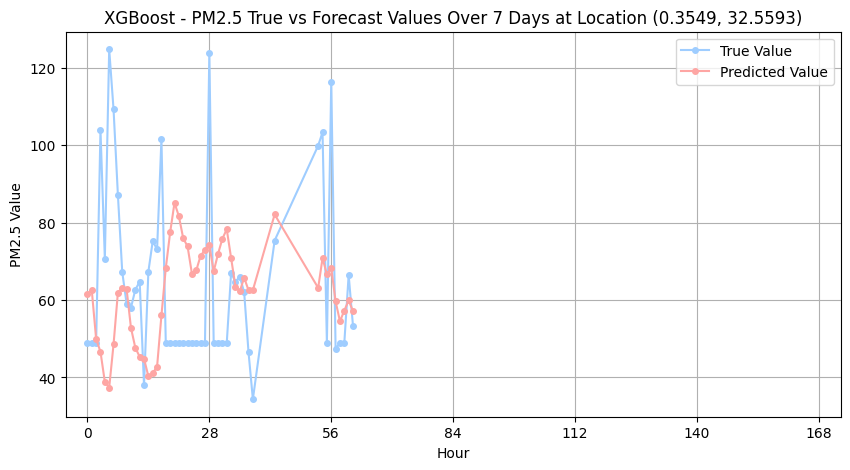

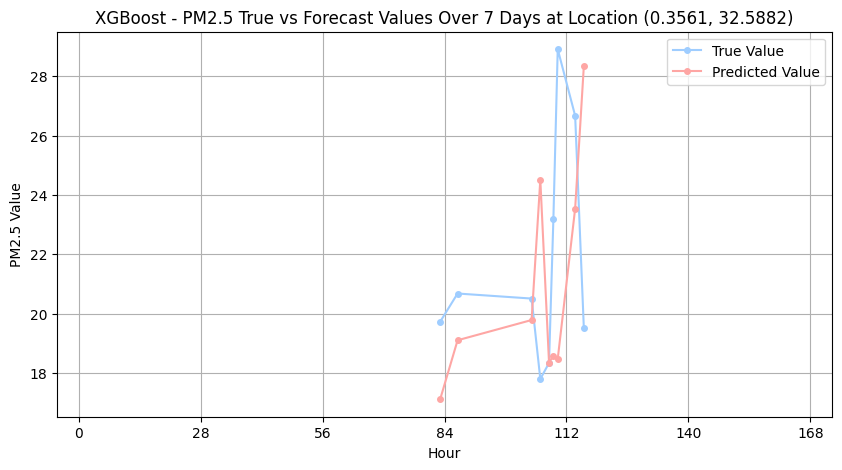

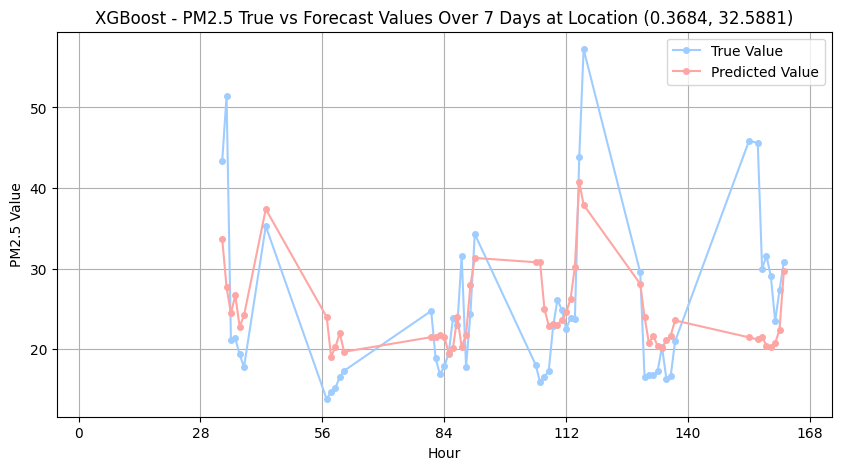

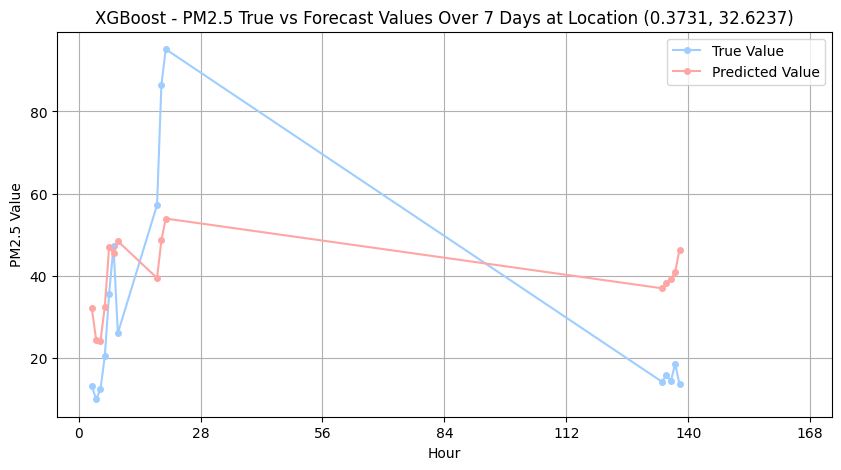

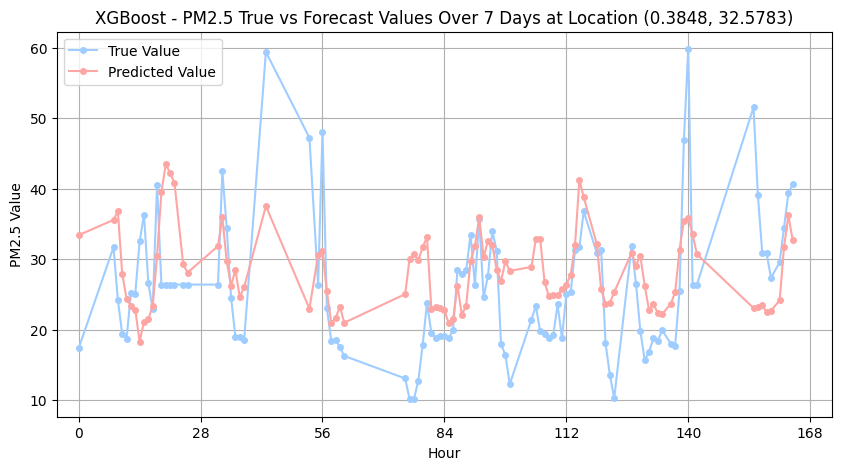

In [56]:
results = pd.DataFrame()
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])

for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_xgboost.best_estimator_.predict(X)

    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')
    plt.title(f"XGBoost - PM2.5 True vs Forecast Values Over 7 Days at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 169, 28))
    plt.xlim(-5, 173)
    plt.legend()
    plt.grid(True)
    plt.show()


## For forecast - For 30 days

In [58]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=30)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]

y_test_day_pred = random_search_xgboost.best_estimator_.predict(X_test_day)

test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))
test_mae = mean_absolute_error(y_test_day, y_test_day_pred)
test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")

Test RMSE: 15.90202106625976
Test MAE: 11.46640801061334
Test MAPE: 38.746275493291265


C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\1694648498.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day
C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\1694648498.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour


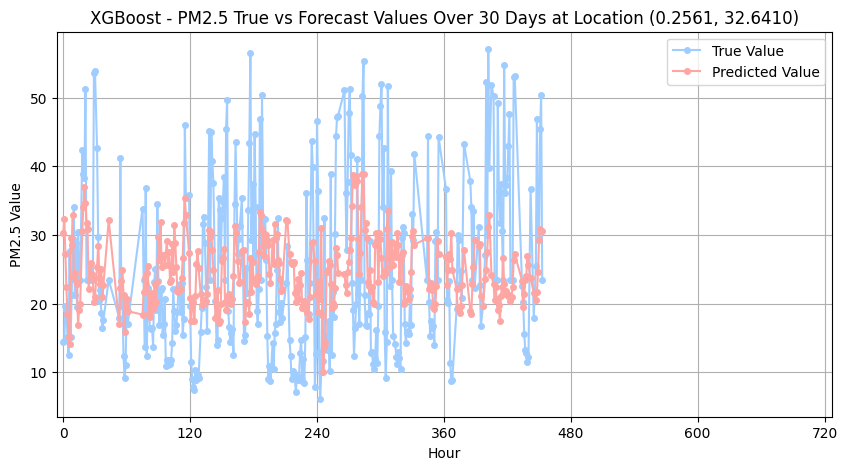

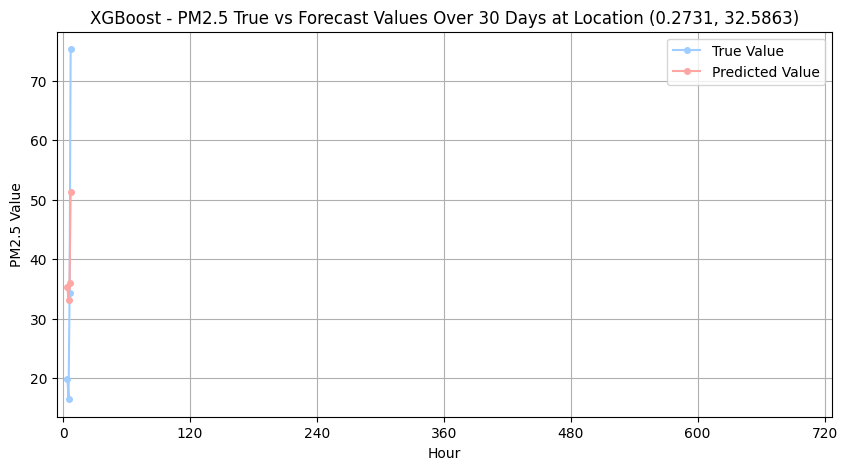

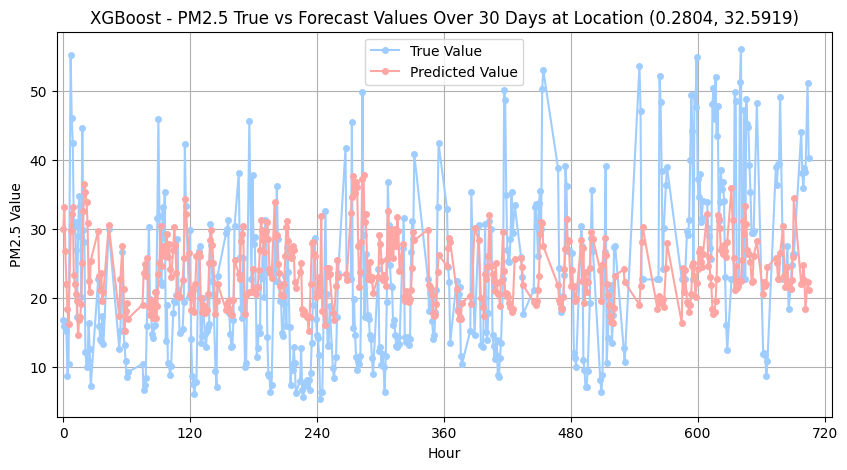

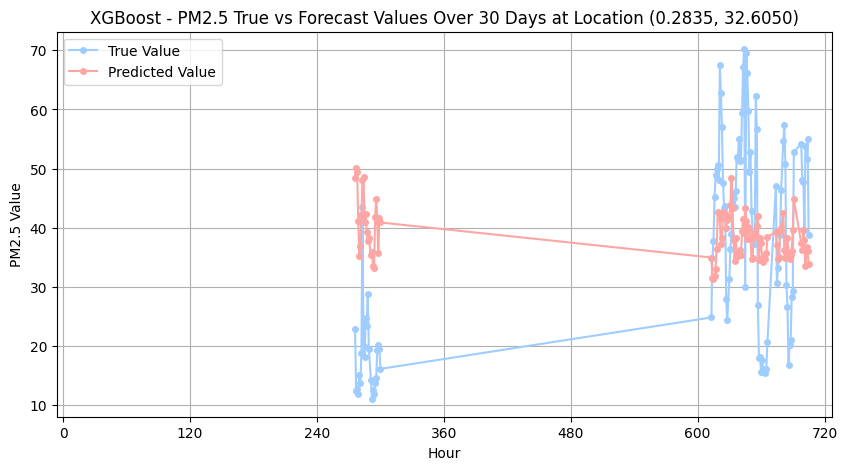

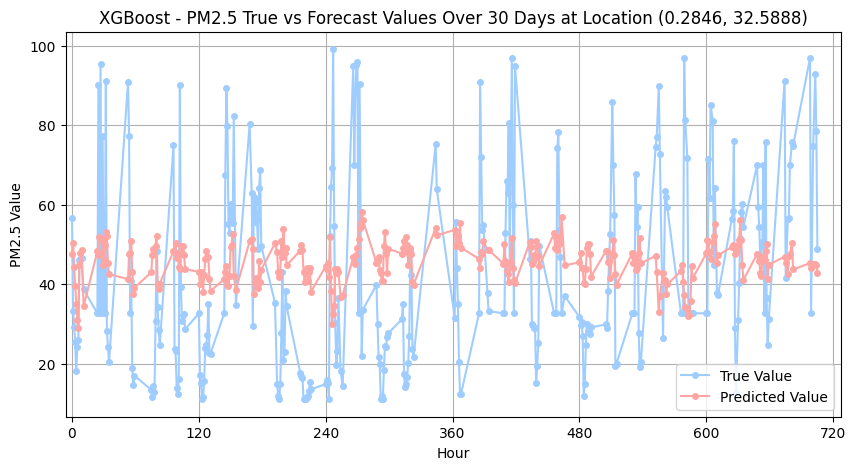

...

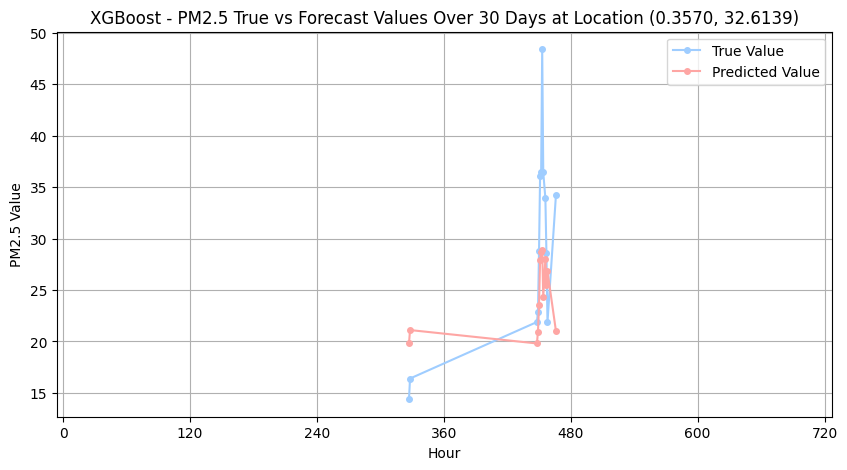

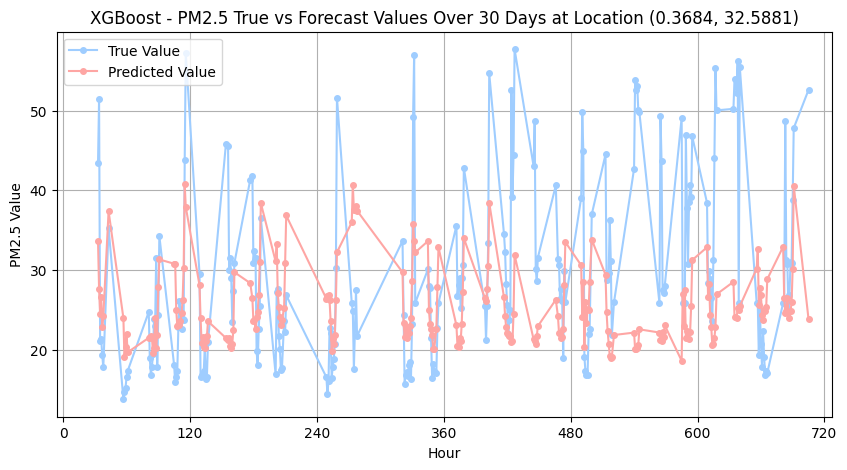

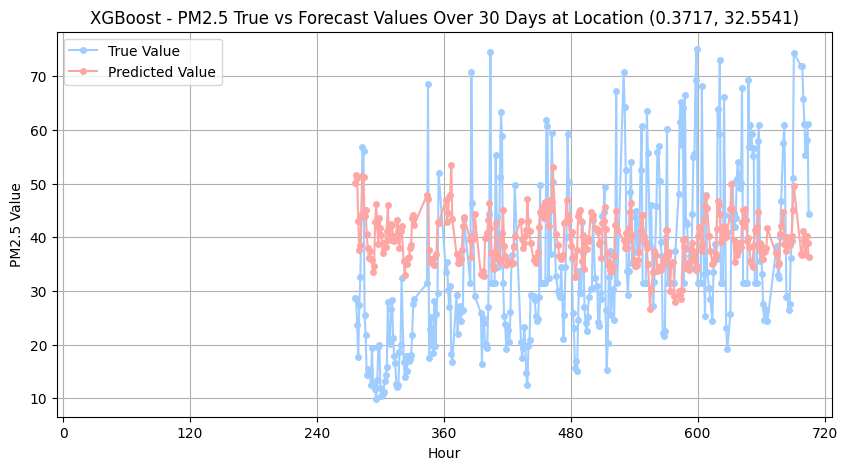

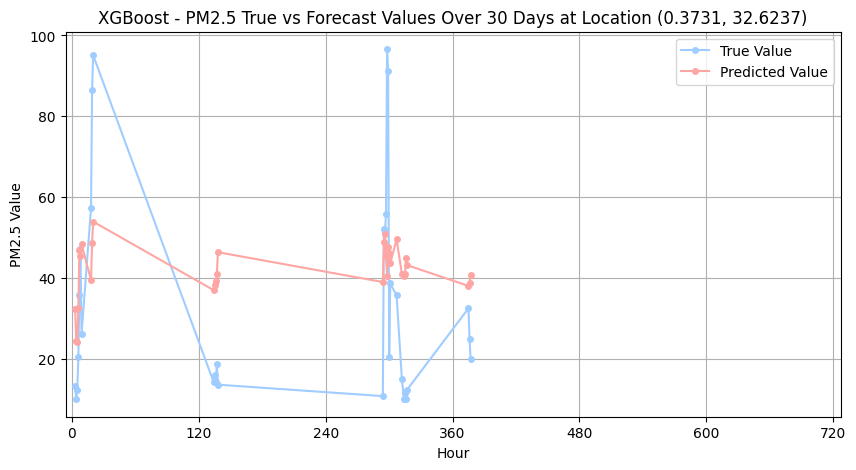

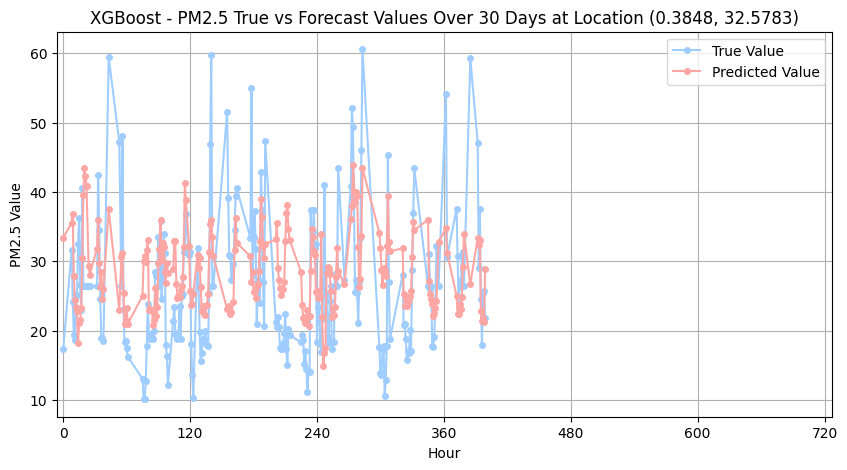

In [59]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

results = pd.DataFrame()
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])
for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_xgboost.best_estimator_.predict(X)

    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4') 
    plt.title(f"XGBoost - PM2.5 True vs Forecast Values Over 30 Days at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 721, 120))
    plt.xlim(-6, 727)
    plt.legend()
    plt.grid(True)
    plt.show()


In [37]:
import numpy as np
import pandas as pd
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import TimeSeriesSplit, RandomizedSearchCV
from sklearn.metrics import mean_squared_error, mean_absolute_error
from scipy.stats import randint, uniform

# 初始化时间序列分割
tss_rf = TimeSeriesSplit(n_splits=4)
# 提取特征和标签
X = data[features_columns]
y = data[target_column]

# 设置随机森林参数分布
param_distributions_rf = {
    'randomforestregressor__n_estimators': randint(100, 1000),
    'randomforestregressor__max_depth': randint(3, 20),
    'randomforestregressor__min_samples_split': randint(2, 20),
    'randomforestregressor__min_samples_leaf': randint(1, 20),
    'randomforestregressor__max_features': uniform(0.1, 0.9)
}

# 初始化随机森林模型
rf_model = RandomForestRegressor(random_state=42)

# 创建Pipeline
pipeline_rf = Pipeline([
    ('scaler', StandardScaler()),  # 数据标准化
    ('randomforestregressor', rf_model)  # 模型
])

# 使用RandomizedSearchCV进行参数搜索
random_search_rf = RandomizedSearchCV(
    estimator=pipeline_rf,
    param_distributions=param_distributions_rf,
    n_iter=20,
    scoring='neg_mean_squared_error',
    cv=tss_rf,
    random_state=2,
    verbose=1,
    return_train_score=True
)

# 模型拟合
random_search_rf.fit(X, y)

# 获取最佳参数
best_params_rf = random_search_rf.best_params_

# 打印最佳参数和模型评估结果
print("Best Parameters:", best_params_rf)
best_rf_model = random_search_rf.best_estimator_




Fitting 4 folds for each of 20 candidates, totalling 80 fits
Best Parameters: {'randomforestregressor__max_depth': 12, 'randomforestregressor__max_features': 0.2460687386520825, 'randomforestregressor__min_samples_leaf': 15, 'randomforestregressor__min_samples_split': 2, 'randomforestregressor__n_estimators': 655}


In [38]:
# 假设 tss_rf 和 best_rf_model 已经定义并训练好了
results = {
    'train_rmse': [],
    'test_rmse': [],
    'train_mae': [],
    'test_mae': []
}

for fold, (train_idx, test_idx) in enumerate(tss_rf.split(X)):
    X_train, X_test = X.iloc[train_idx], X.iloc[test_idx]
    y_train, y_test = y.iloc[train_idx], y.iloc[test_idx]

    y_train_pred = best_rf_model.predict(X_train)
    y_test_pred = best_rf_model.predict(X_test)

    train_rmse = np.sqrt(mean_squared_error(y_train, y_train_pred))
    test_rmse = np.sqrt(mean_squared_error(y_test, y_test_pred))
    train_mae = mean_absolute_error(y_train, y_train_pred)
    test_mae = mean_absolute_error(y_test, y_test_pred)

    results['train_rmse'].append(train_rmse)
    results['test_rmse'].append(test_rmse)
    results['train_mae'].append(train_mae)
    results['test_mae'].append(test_mae)

    print(f"Fold {fold+1}: Train RMSE: {train_rmse:.4f}, Test RMSE: {test_rmse:.4f}, Train MAE: {train_mae:.4f}, Test MAE: {test_mae:.4f}")

# 输出整体交叉验证结果
overall_results = {
    'train_rmse': np.mean(results['train_rmse']),
    'test_rmse': np.mean(results['test_rmse']),
    'train_mae': np.mean(results['train_mae']),
    'test_mae': np.mean(results['test_mae'])
}
print("Overall CV Results:", overall_results)

Fold 1: Train RMSE: 14.9106, Test RMSE: 13.5319, Train MAE: 11.3528, Test MAE: 9.7439
Fold 2: Train RMSE: 14.2380, Test RMSE: 13.5732, Train MAE: 10.5484, Test MAE: 9.8651
Fold 3: Train RMSE: 14.0199, Test RMSE: 13.1146, Train MAE: 10.3206, Test MAE: 9.5041
Fold 4: Train RMSE: 13.7991, Test RMSE: 13.1050, Train MAE: 10.1165, Test MAE: 9.3891
Overall CV Results: {'train_rmse': 14.241898171283717, 'test_rmse': 13.331147099613702, 'train_mae': 10.584587698812637, 'test_mae': 9.625566061522136}


In [68]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]
# 预测新的测试数据
y_test_day_pred = random_search_rf.best_estimator_.predict(X_test_day)
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# 假设 y_test_day_pred 是你的预测结果，y_test_day 是相应的真实目标值

# 计算 RMSE
test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))

# 计算 MAE
test_mae = mean_absolute_error(y_test_day, y_test_day_pred)

# 计算 MAPE
test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

# 打印性能指标
print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")


Test RMSE: 13.807487893446941
Test MAE: 9.457045579685836
Test MAPE: 30.90407359394814


In [61]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day==1)]

C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\3807675241.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = data_test_day.index.hour


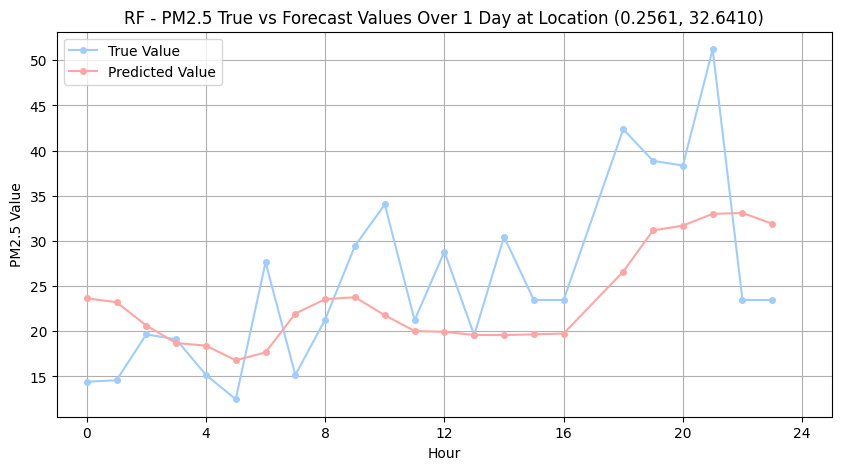

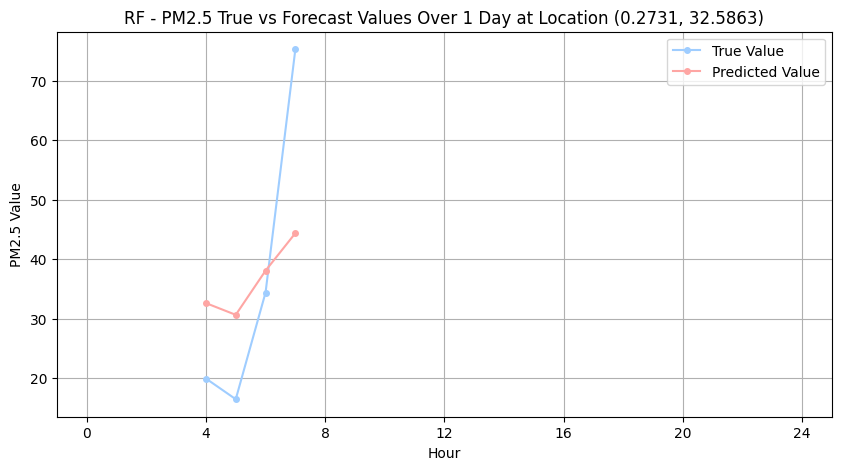

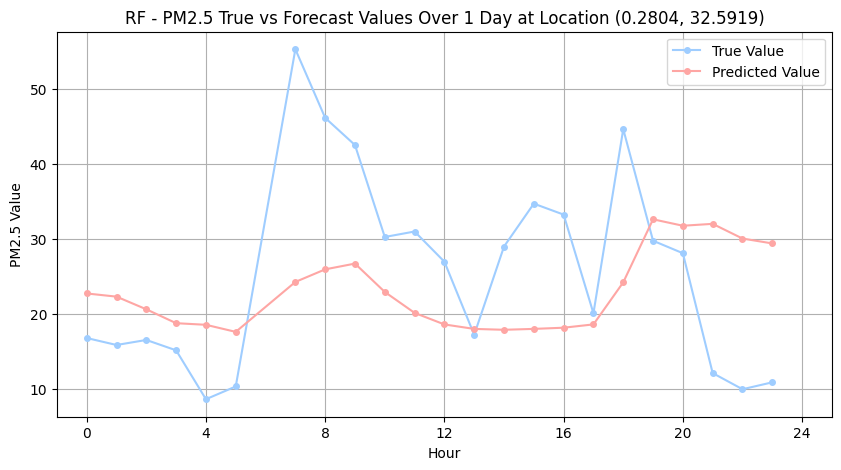

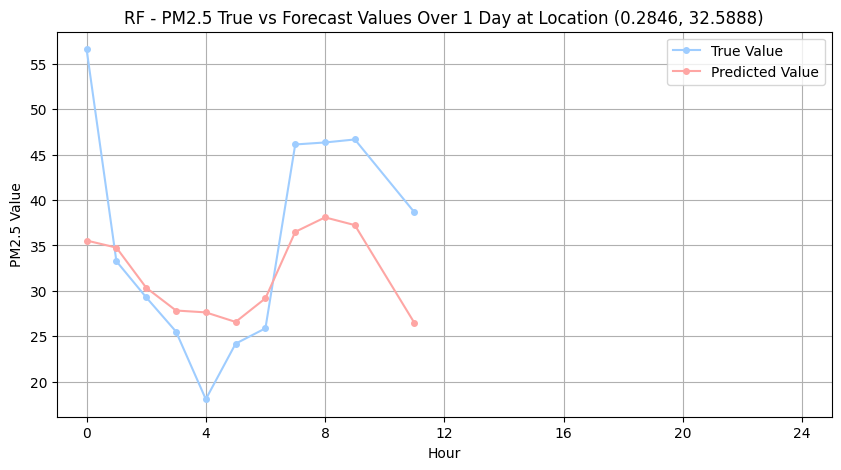

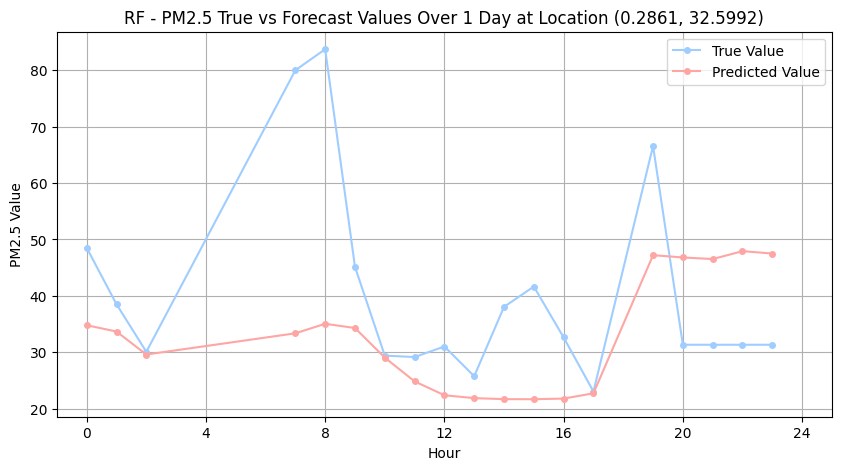

...

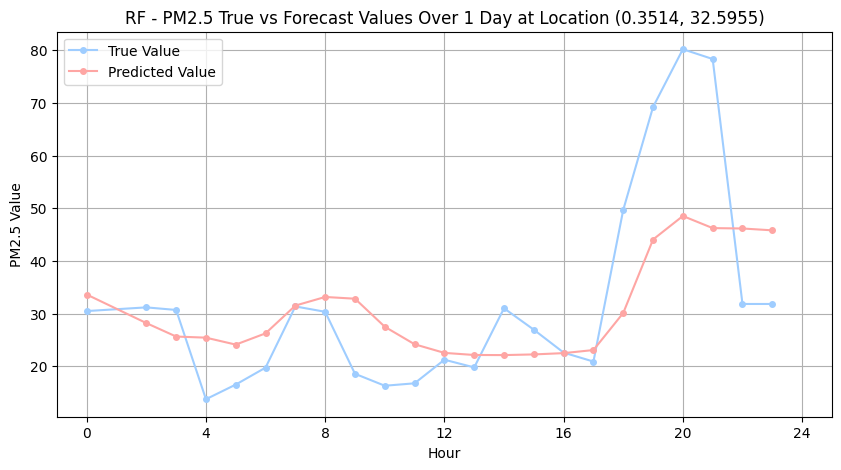

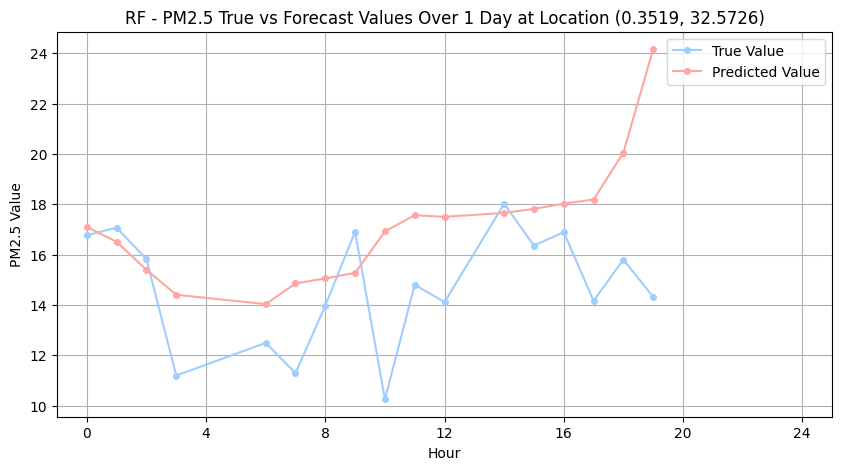

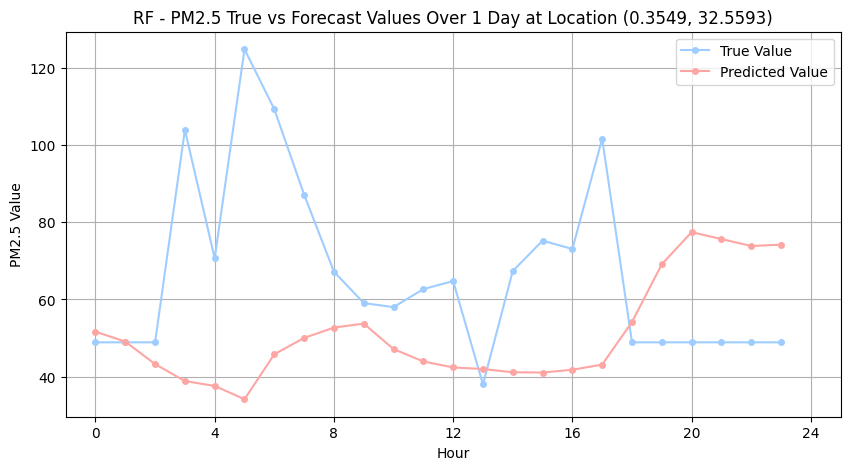

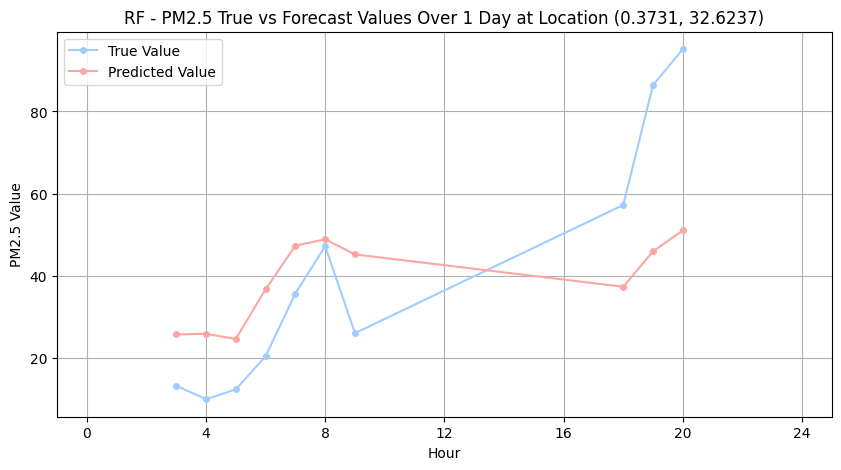

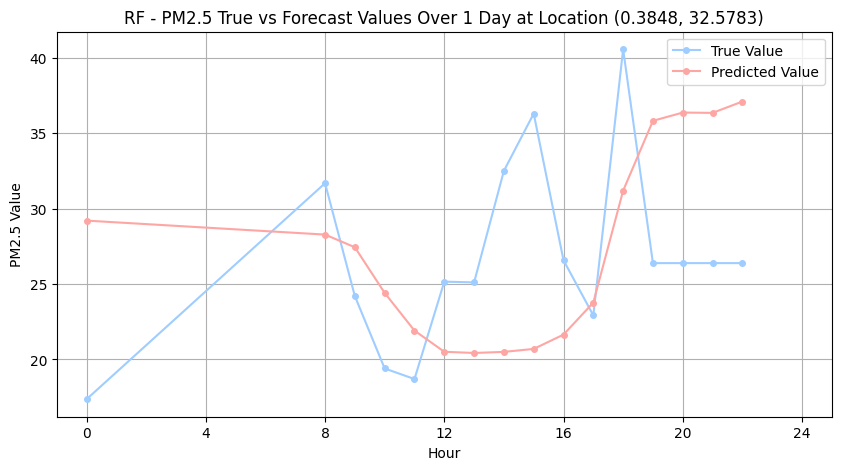

In [62]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 确保 data_test_day 包含 'hour' 列
data_test_day['hour'] = data_test_day.index.hour

# 创建一个空的 DataFrame 来存储结果
results = pd.DataFrame()

# 按地点和小时分组
grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])

# 遍历每个地点和小时
for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_rf.best_estimator_.predict(X)

    # 构建一个临时 DataFrame 并合并
    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

# 绘制每个地点的真实值和预测值对比图
for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')  # 蓝色，小点
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')  # 红色，小点
    plt.title(f"RF - PM2.5 True vs Forecast Values Over 1 Day at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks([0, 4, 8, 12, 16, 20, 24])
    plt.xlim(-1, 25)
    plt.legend()
    plt.grid(True)
    plt.show()




In [42]:
# 获取独一无二的 'site_latitude' 和 'site_longitude' 组合
unique_locations = data_test_day[['site_latitude', 'site_longitude']].drop_duplicates()

# 显示独一无二的地点
print(unique_locations)



                           site_latitude  site_longitude
datetime                                                
2022-12-01 00:00:00+03:00       0.354913       32.559346
2022-12-01 00:00:00+03:00       0.320056       32.571821
2022-12-01 00:00:00+03:00       0.323826       32.571850
2022-12-01 00:00:00+03:00       0.329076       32.634791
2022-12-01 00:00:00+03:00       0.337095       32.610288
2022-12-01 00:00:00+03:00       0.284617       32.588796
2022-12-01 00:00:00+03:00       0.290822       32.553698
2022-12-01 00:00:00+03:00       0.286137       32.599234
2022-12-01 00:00:00+03:00       0.310228       32.604930
2022-12-01 00:00:00+03:00       0.280357       32.591917
2022-12-01 00:00:00+03:00       0.329264       32.566964
2022-12-01 00:00:00+03:00       0.294889       32.575307
2022-12-01 00:00:00+03:00       0.351354       32.595478
2022-12-01 00:00:00+03:00       0.311979       32.620263
2022-12-01 00:00:00+03:00       0.310792       32.654781
2022-12-01 00:00:00+03:00      

In [64]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=7)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]
# 预测新的测试数据
y_test_day_pred = random_search_rf.best_estimator_.predict(X_test_day)
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# 假设 y_test_day_pred 是你的预测结果，y_test_day 是相应的真实目标值

# 计算 RMSE
test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))

# 计算 MAE
test_mae = mean_absolute_error(y_test_day, y_test_day_pred)

# 计算 MAPE
test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

# 打印性能指标
print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")


Test RMSE: 12.485028152413918
Test MAE: 8.921952725566289
Test MAPE: 38.22344637769523


C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\830720045.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day
C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\830720045.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour


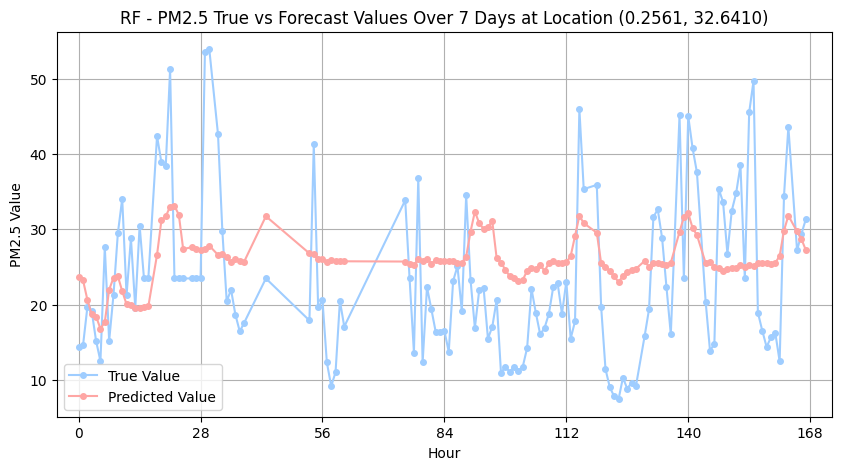

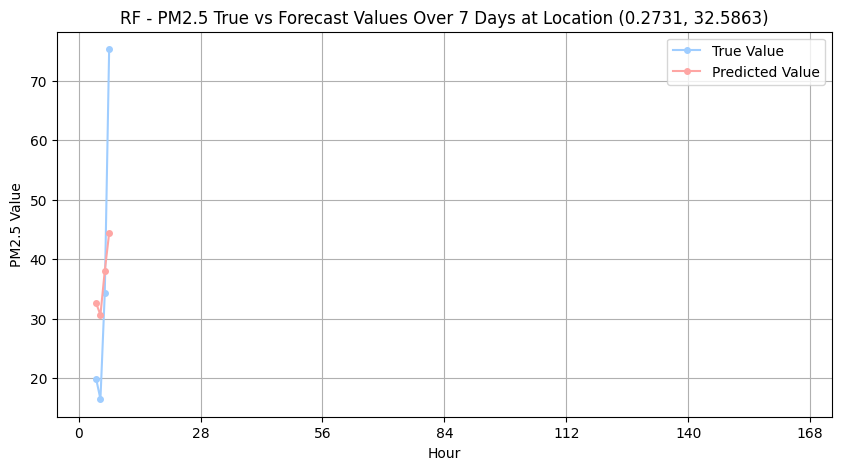

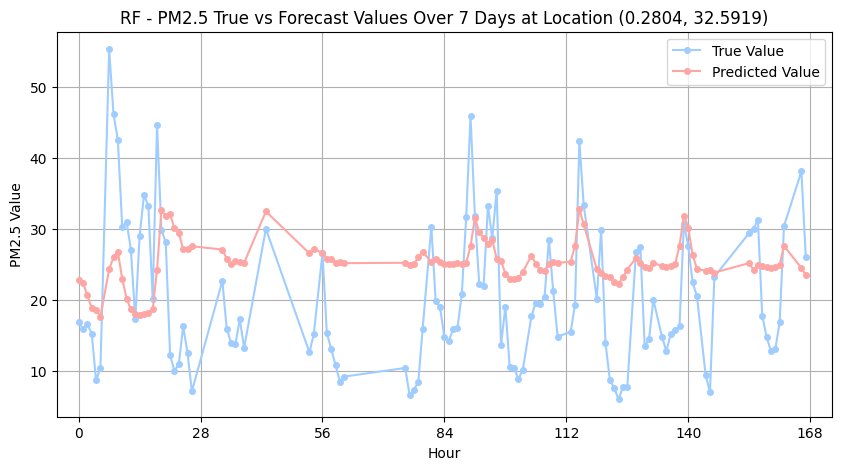

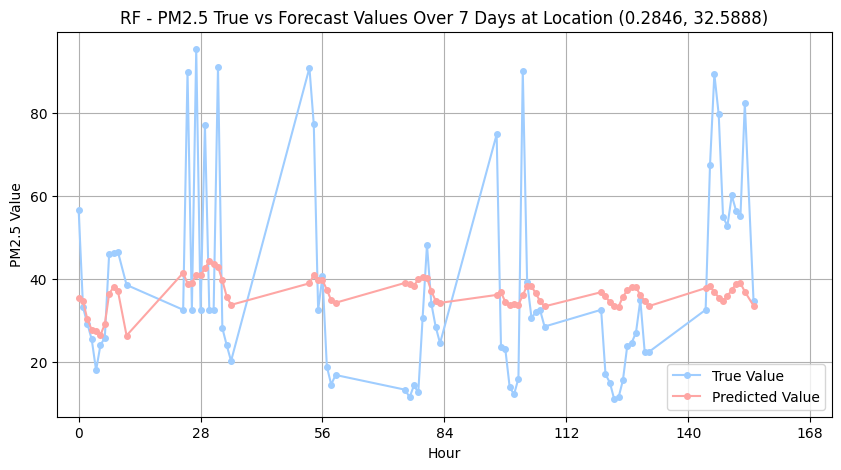

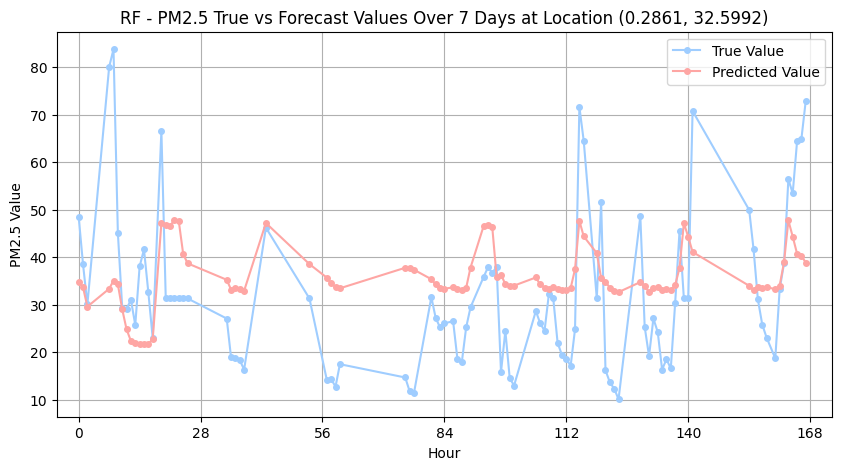

...

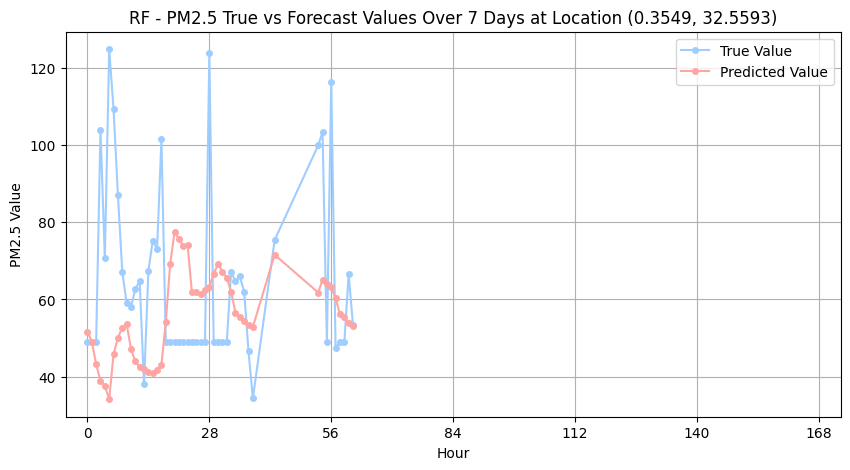

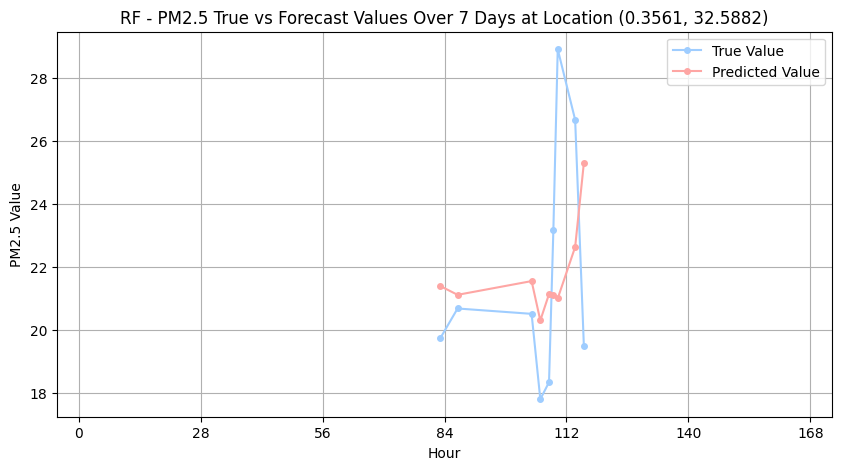

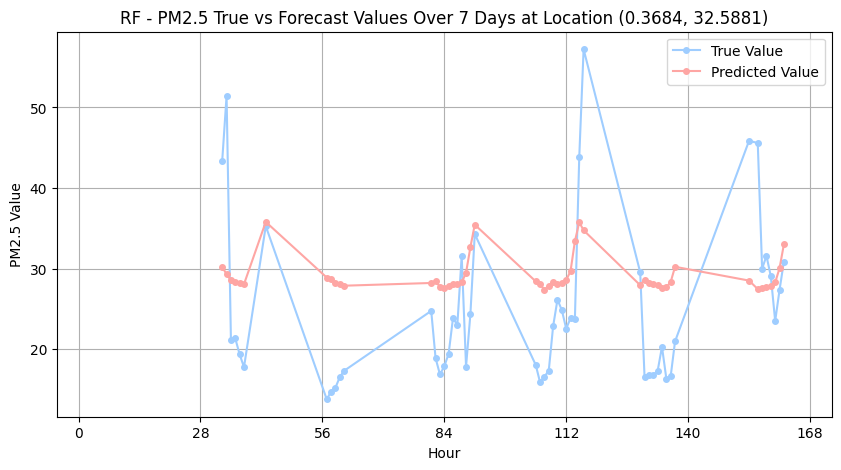

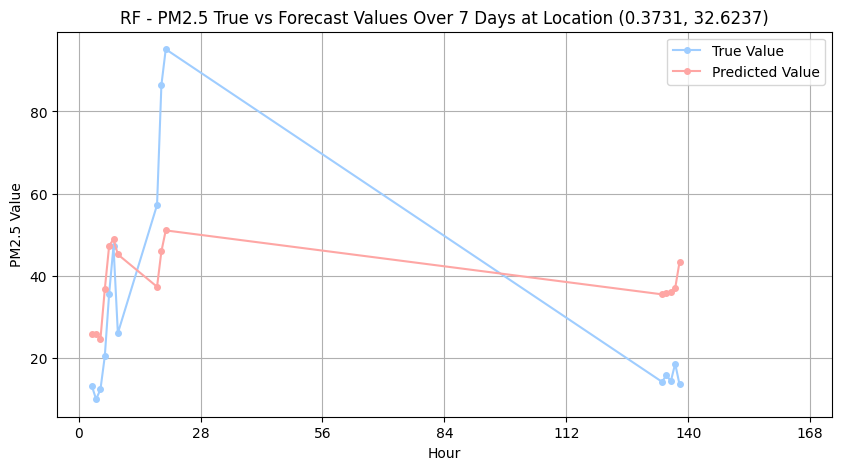

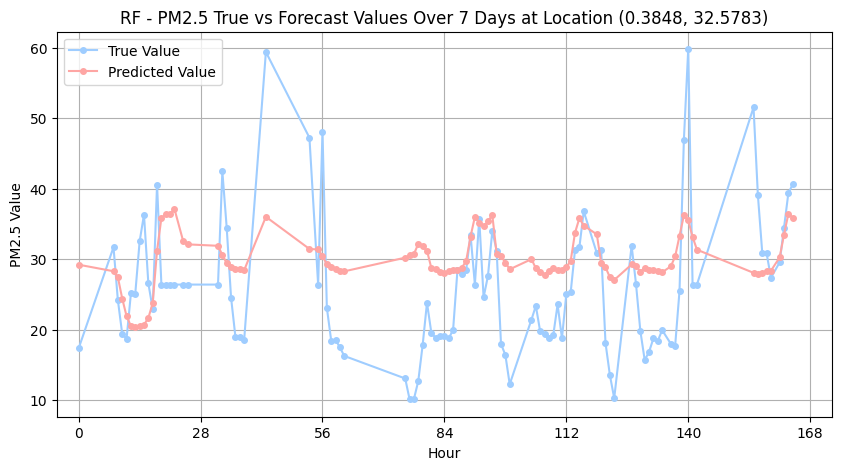

In [65]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 创建一个空的 DataFrame 来存储结果
results = pd.DataFrame()

# 确保 data_test_day 包含 'hour' 和 'day' 列
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

# 按地点和小时分组
grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])

# 遍历每个地点和小时
for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_rf.best_estimator_.predict(X)

    # 构建一个临时 DataFrame 并合并
    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

# 绘制每个地点的真实值和预测值对比图
for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')  # 蓝色，小点
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')  # 红色，小点
    plt.title(f"RF - PM2.5 True vs Forecast Values Over 7 Days at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 169, 28))
    plt.xlim(-5, 173)
    plt.legend()
    plt.grid(True)
    plt.show()


In [45]:
# 获取独一无二的 'site_latitude' 和 'site_longitude' 组合
unique_locations = data_test_day[['site_latitude', 'site_longitude']].drop_duplicates()

# 显示独一无二的地点
print(unique_locations)



                           site_latitude  site_longitude
datetime                                                
2022-12-01 00:00:00+03:00       0.354913       32.559346
2022-12-01 00:00:00+03:00       0.320056       32.571821
2022-12-01 00:00:00+03:00       0.323826       32.571850
2022-12-01 00:00:00+03:00       0.329076       32.634791
2022-12-01 00:00:00+03:00       0.337095       32.610288
2022-12-01 00:00:00+03:00       0.284617       32.588796
2022-12-01 00:00:00+03:00       0.290822       32.553698
2022-12-01 00:00:00+03:00       0.286137       32.599234
2022-12-01 00:00:00+03:00       0.310228       32.604930
2022-12-01 00:00:00+03:00       0.280357       32.591917
2022-12-01 00:00:00+03:00       0.329264       32.566964
2022-12-01 00:00:00+03:00       0.294889       32.575307
2022-12-01 00:00:00+03:00       0.351354       32.595478
2022-12-01 00:00:00+03:00       0.311979       32.620263
2022-12-01 00:00:00+03:00       0.310792       32.654781
2022-12-01 00:00:00+03:00      

In [66]:
data_test_day = data_test[(data_test.index.month==12) & (data_test.index.day<=30)]
X_test_day = data_test_day[features_columns]
y_test_day = data_test_day[target_column]
# 预测新的测试数据
y_test_day_pred = random_search_rf.best_estimator_.predict(X_test_day)
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np

# 假设 y_test_day_pred 是你的预测结果，y_test_day 是相应的真实目标值

# 计算 RMSE
test_rmse = np.sqrt(mean_squared_error(y_test_day, y_test_day_pred))

# 计算 MAE
test_mae = mean_absolute_error(y_test_day, y_test_day_pred)

# 计算 MAPE
test_mape = np.mean(np.abs((y_test_day - y_test_day_pred) / y_test_day)) * 100

# 打印性能指标
print(f"Test RMSE: {test_rmse}")
print(f"Test MAE: {test_mae}")
print(f"Test MAPE: {test_mape}")


Test RMSE: 15.557870397101658
Test MAE: 11.186016426048102
Test MAPE: 38.35897792906963


C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\1746409288.py:10: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['day'] = data_test_day.index.day
C:\Users\DELL\AppData\Local\Temp\ipykernel_27168\1746409288.py:11: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour


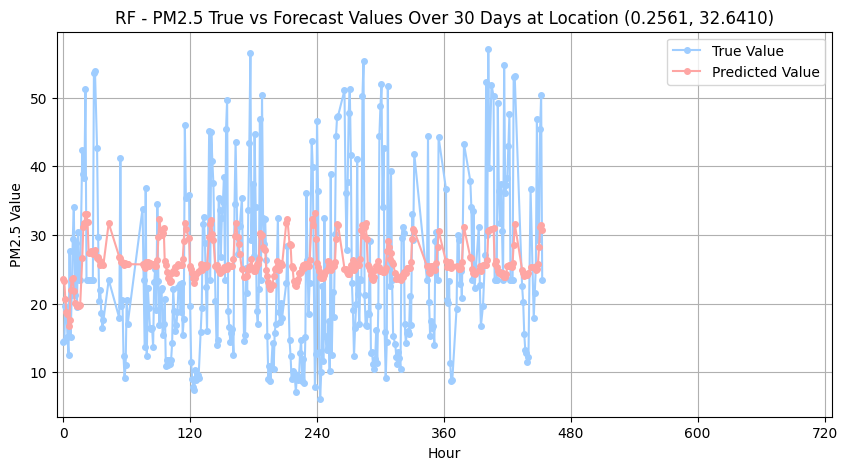

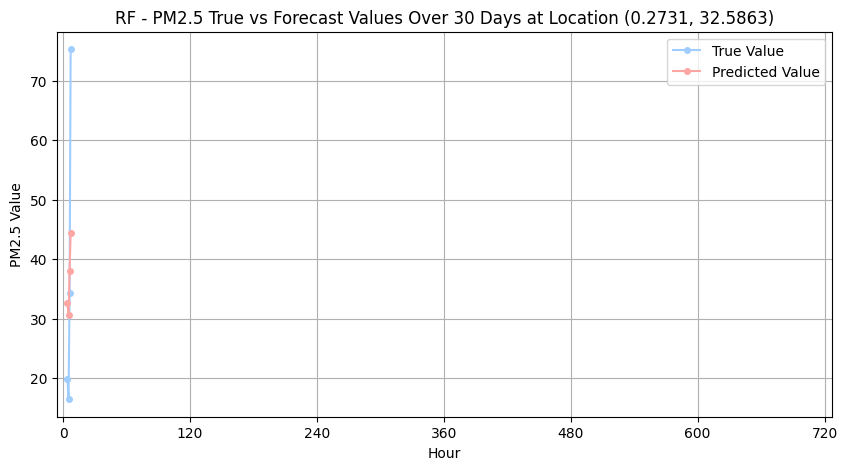

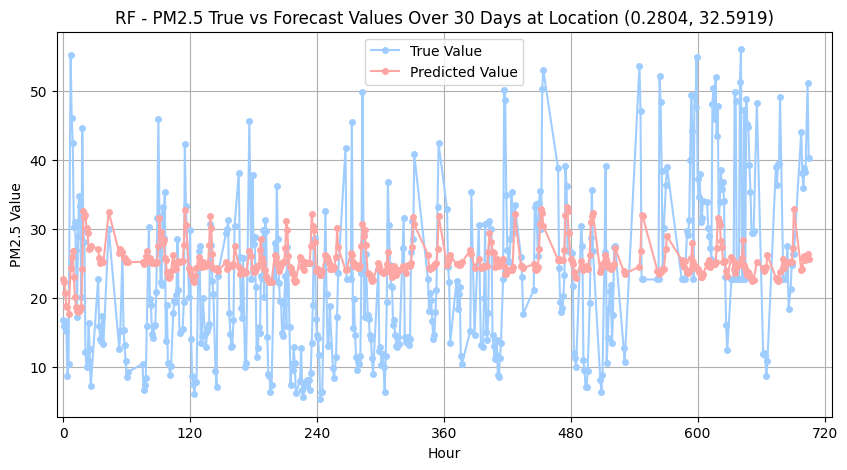

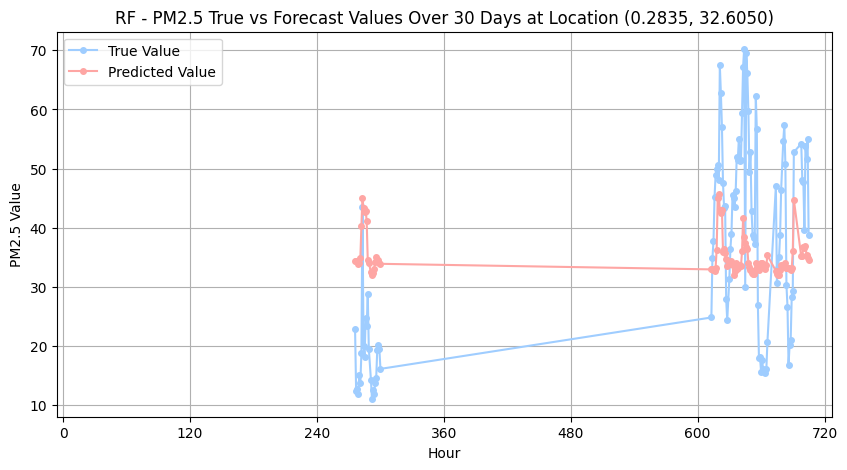

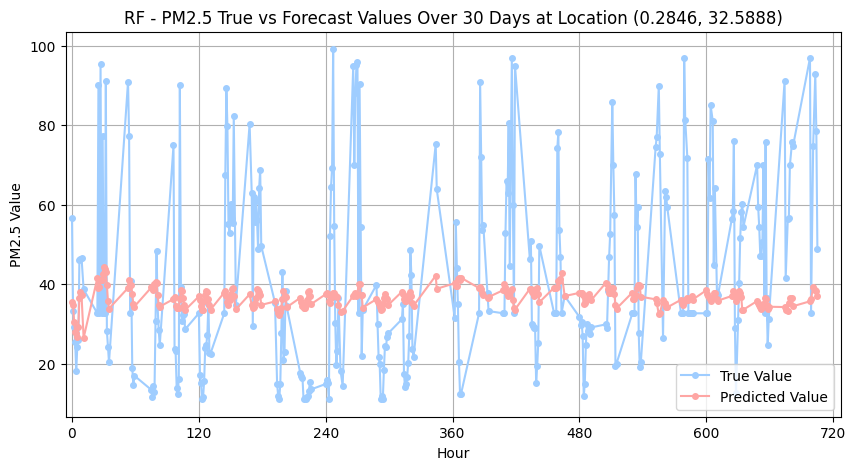

...

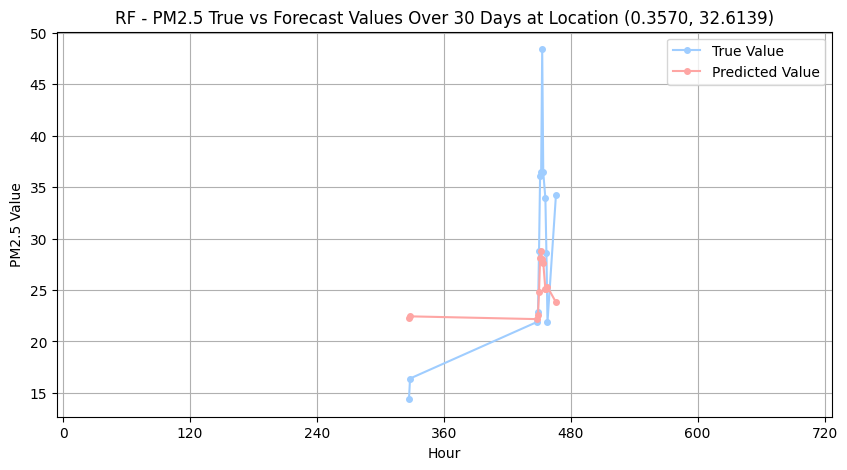

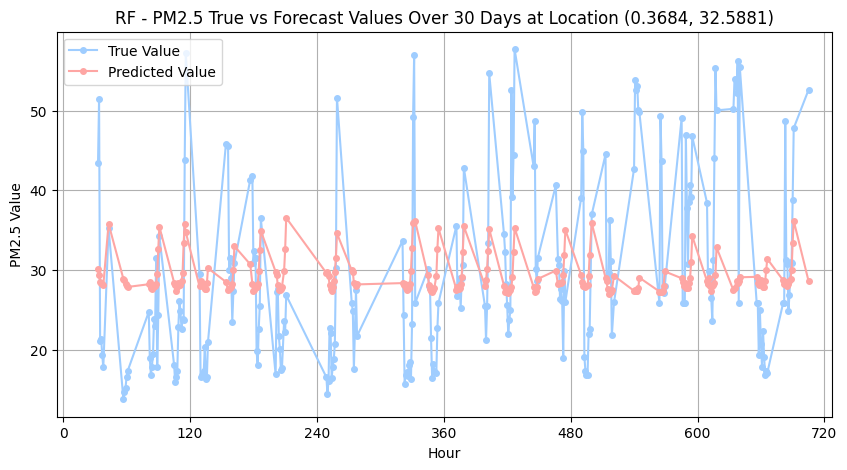

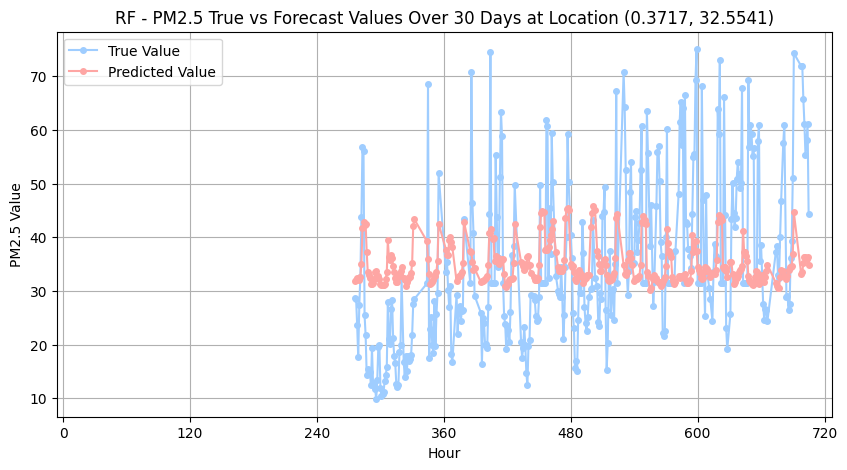

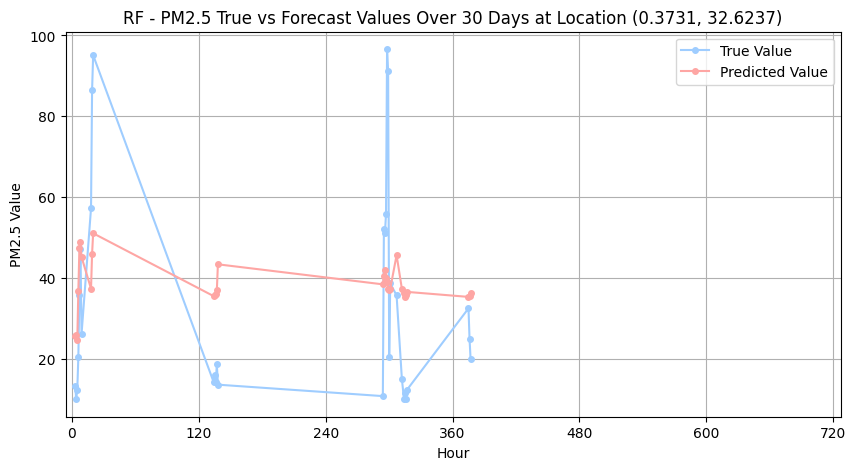

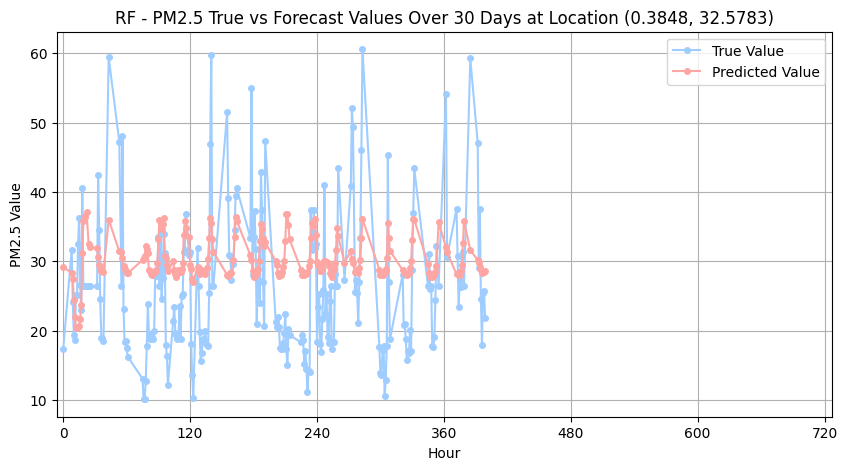

In [67]:
import pandas as pd
import numpy as np
from sklearn.metrics import mean_squared_error, mean_absolute_error
import matplotlib.pyplot as plt

# 创建一个空的 DataFrame 来存储结果
results = pd.DataFrame()

# 确保 data_test_day 包含 'hour' 和 'day' 列
data_test_day['day'] = data_test_day.index.day
data_test_day['hour'] = (data_test_day['day'] - data_test_day['day'].min()) * 24 + data_test_day.index.hour

# 按地点和小时分组
grouped = data_test_day.groupby(['site_latitude', 'site_longitude', 'hour'])

# 遍历每个地点和小时
for (lat, long, hour), group in grouped:
    X = group[features_columns]
    y_true = group[target_column]
    y_pred = random_search_rf.best_estimator_.predict(X)

    # 构建一个临时 DataFrame 并合并
    temp_df = pd.DataFrame({
        'Latitude': [lat] * len(y_true),
        'Longitude': [long] * len(y_true),
        'Hour': [hour] * len(y_true),
        'True Value': y_true,
        'Predicted Value': y_pred
    })
    results = pd.concat([results, temp_df], ignore_index=True)

# 绘制每个地点的真实值和预测值对比图


for (lat, long), group in results.groupby(['Latitude', 'Longitude']):
    plt.figure(figsize=(10, 5))
    plt.plot(group['Hour'], group['True Value'], label='True Value', marker='o', markersize=4, color='#9FCDFF')  # 蓝色，小点
    plt.plot(group['Hour'], group['Predicted Value'], label='Predicted Value', marker='o', markersize=4, color='#FEA6A4')  # 红色，小点
    plt.title(f"RF - PM2.5 True vs Forecast Values Over 30 Days at Location ({lat:.4f}, {long:.4f})")
    plt.xlabel('Hour')
    plt.ylabel('PM2.5 Value')
    plt.xticks(np.arange(0, 721, 120))
    plt.xlim(-6, 727)
    plt.legend()
    plt.grid(True)
    plt.show()
